# LTSM Double Pendulum - Chaotic Systems

### Kinematics of the double pendulum

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

#Import tqdm for progress bar
from tqdm import tqdm

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

In [ ]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2


In [ ]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [ ]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


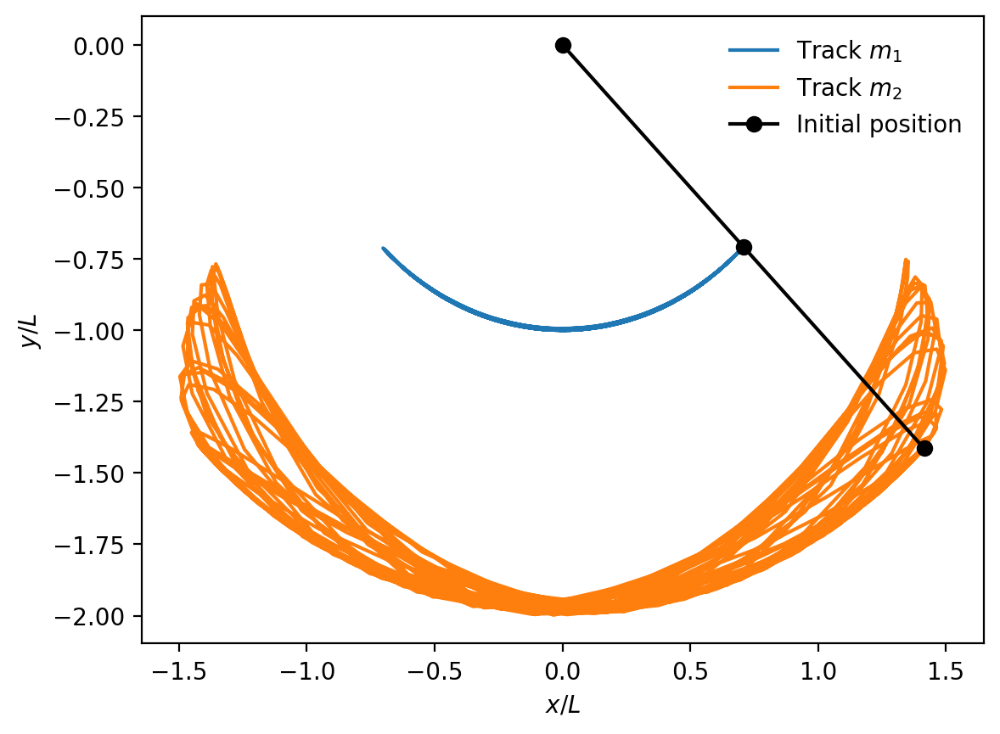

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Predicting Chaos


## Designing and training a recurrent neural network to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$.

In [ ]:
#Defining functions
#Defaults
windowsize = 20
offset = 20

def shapeArray(x, windowsize, offset):
  """Shapes an input array into input-label pairs for time series prediction.

  This function takes a time series array and creates two new arrays:
  one for the input data (xInput) and one for the corresponding labels (xLabel).
  It uses a sliding window approach to create these pairs.

  Args:
    x: The input time series array.
    windowsize: The size of the sliding window (number of past time steps).
    offset: The number of time steps into the future to predict.

  Returns:
    A tuple containing two numpy arrays:
      xInput: The input data, shaped as (number of samples, windowsize, number of features).
      xLabel: The corresponding labels, shaped as (number of samples, offset, number of features).
  """
  xInput = np.array([x[i : i + windowsize] for i in range(len(x) - (windowsize + offset) + 1)])
  xLabel = np.array([x[i + windowsize : i + windowsize + offset] for i in range(len(x) - (windowsize + offset) + 1)])
  return (xInput, xLabel)



def create_and_train_model(z0, tmax, dt, train_on_both_masses=True):
  """Creates and trains a neural network model for double pendulum prediction.

  This function simulates the double pendulum, prepares the data, creates a
  neural network model, trains it on the data, and then returns the trained model.

  Args:
    z0: Initial conditions for the double pendulum (list or numpy array).
    tmax: Maximum simulation time (float).
    dt: Time step for the simulation and prediction (float).
    train_on_both_masses: Boolean indicating whether to train the model on both
                          masses (m1 and m2) or just m2 (default: True).

  Returns:
    A trained Keras neural network model.
  """
  t = np.arange(0, tmax + dt, dt)

  # Solve initial value problem (using the provided initial conditions z0)
  ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z = ret.y
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Prepare data for prediction
  positions = np.column_stack([x1, y1, x2, y2])

  if train_on_both_masses:
    # Use all 4 coordinates (x1, y1, x2, y2)
    input_features = positions
  else:
    # Use only x2, y2 (coordinates of m2)
    input_features = positions[:, 2:]

  xInput, xLabel = shapeArray(input_features, windowsize, offset)
  yInput = xInput
  yLabel = xLabel[:, -1, :]

  # Create a new model
  model = keras.models.Sequential()
  model.add(keras.layers.Input(shape=(windowsize, input_features.shape[1])))  # Adjust input shape
  model.add(keras.layers.LSTM(64, return_sequences=False))
  model.add(keras.layers.Dense(input_features.shape[1], activation="linear"))  # Adjust output shape
  model.compile(loss='mean_squared_error', optimizer='adam')

  # Train the model
  model.fit(yInput, yLabel, epochs=50, batch_size=32, verbose=0)

  return model



def predict_and_plot_trajectories(z0, tmax, dt, plot_both_masses=True):
  """Predicts and plots the true and predicted trajectories of a double pendulum.

  This function uses a pre-trained neural network model to predict the future
  positions of the double pendulum's masses and compares them to the true
  trajectories obtained from numerical integration.

  Args:
    z0: Initial conditions for the double pendulum (list or numpy array).
    tmax: Maximum simulation time (float).
    dt: Time step for the simulation and prediction (float).
    plot_both_masses: Boolean indicating whether to plot both masses
                      (m1 and m2) or just m2 (default: True).

  Returns:
    None. Displays the plot of true and predicted trajectories.
  """
  t = np.arange(0, tmax + dt, dt)

  # Solve initial value problem (using the provided initial conditions z0)
  ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z = ret.y
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Prepare data for prediction (same as earlier in the notebook)
  positions = np.column_stack([x1, y1, x2, y2])

  # Select input features based on plot_both_masses
  if plot_both_masses:
      input_features = positions  # Use all 4 coordinates (x1, y1, x2, y2)
  else:
      input_features = positions[:, 2:]  # Use only x2, y2 (coordinates of m2)

  xInput, xLabel = shapeArray(input_features, windowsize, offset)
  yInput = xInput
  yLabel = xLabel[:, -1, :]

  # Predict future positions using the trained network
  future_positions = model.predict_on_batch(yInput)

  # Plot the results (adjust the plot to use x1, y1, x2, y2 derived from the new z0)
  fig, ax = plt.subplots()

  if plot_both_masses:
      ax.plot(x2, y2, label=r"True $m_2$ trajectory", linestyle='--')
      predicted_x2 = future_positions[:, 2]
      predicted_y2 = future_positions[:, 3]
      ax.plot(predicted_x2, predicted_y2, label=r"Network predicted trajectory", linestyle='-')
      ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
  else:  # Only plotting m2
      ax.plot(x2, y2, label=r"True $m_2$ trajectory", linestyle='--')
      predicted_x2 = future_positions[:, 0]  # Accessing x2 from the first column of future_positions
      predicted_y2 = future_positions[:, 1]  # Accessing y2 from the second column of future_positions
      ax.plot(predicted_x2, predicted_y2, label=r"Network predicted trajectory", linestyle='-')
      ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')

  plt.ylabel(r"$y/L$")
  plt.xlabel(r"$x/L$")
  ax.set_title(f"Double Pendulum: True vs. Predicted Trajectory of Mass m2\n"
               f"Initial Conditions: {z0}, tmax: {tmax}, dt: {dt}")

  ax.legend()
  plt.show()



def plot_prediction_deviation(z0, tmax, dt, train_on_both_masses=True, num_offsets=9):
    """Plots the average total deviation between predicted and actual positions
       of the double pendulum for different offset values.

    This function simulates the double pendulum, trains a new neural network for each offset value,
    predicts its future positions, calculates the average total deviation over time for both masses
    (m1 and m2) using Pythagoras' theorem, and then plots the average total deviations against
    the corresponding offset values.

    Args:
        z0: Initial conditions for the double pendulum (list or numpy array).
        tmax: Maximum simulation time (float).
        dt: Time step for the simulation and prediction (float).
        train_on_both_masses: Boolean indicating whether to train the model on both
                              masses (m1 and m2) or just m2 (default: True).
        num_offsets: The number of offset values to test and plot (default: 9).

    Returns:
        None. Displays the plot of average total deviations vs. offset values.
    """
    t = np.arange(0, tmax + dt, dt)

    # Solve initial value problem (using the provided initial conditions z0)
    ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z = ret.y
    theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

    # Prepare data for prediction
    positions = np.column_stack([x1, y1, x2, y2])

    if train_on_both_masses:
        # Use all 4 coordinates (x1, y1, x2, y2)
        input_features = positions
        num_features = 4
    else:
        # Use only x2, y2 (coordinates of m2)
        input_features = positions[:, 2:]
        num_features = 2

    # Define range of offsets
    offsets = np.linspace(20, 100, num_offsets, dtype=int)

    # Store average total deviations for each offset
    avg_total_deviations_m1 = []
    avg_total_deviations_m2 = []

    # Loop through different offset values
    for offset in offsets:
        # Prepare data for the current offset
        xInput, xLabel = shapeArray(input_features, windowsize, offset)
        yInput = xInput
        yLabel = xLabel[:, -1, :]

        # Create and train a new model
        model = keras.models.Sequential()
        model.add(keras.layers.Input(shape=(windowsize, num_features)))
        model.add(keras.layers.LSTM(64, return_sequences=False))
        model.add(keras.layers.Dense(num_features, activation="linear"))
        model.compile(loss='mean_squared_error', optimizer='adam')
        model.fit(yInput, yLabel, epochs=50, batch_size=32, verbose=0)

        # Predict future positions
        future_positions = model.predict_on_batch(yInput)

        # Calculate deviation for both masses
        true_x1 = yLabel[:, 0]  # True x-coordinate of m1
        true_y1 = yLabel[:, 1]  # True y-coordinate of m1
        predicted_x1 = future_positions[:, 0]  # Predicted x-coordinate of m1
        predicted_y1 = future_positions[:, 1]  # Predicted y-coordinate of m1
        deviation_x1 = predicted_x1 - true_x1
        deviation_y1 = predicted_y1 - true_y1

        if train_on_both_masses:
          true_x2 = yLabel[:, 2]  # True x-coordinate of m2
          true_y2 = yLabel[:, 3]  # True y-coordinate of m2
          predicted_x2 = future_positions[:, 2]  # Predicted x-coordinate of m2
          predicted_y2 = future_positions[:, 3]  # Predicted y-coordinate of m2
          deviation_x2 = predicted_x2 - true_x2
          deviation_y2 = predicted_y2 - true_y2
          total_deviation_m2 = np.sqrt(deviation_x2**2 + deviation_y2**2)
          avg_total_deviations_m2.append(np.mean(total_deviation_m2))

        # Calculate total deviation using Pythagoras
        total_deviation_m1 = np.sqrt(deviation_x1**2 + deviation_y1**2)

        # Calculate and store average total deviations
        avg_total_deviations_m1.append(np.mean(total_deviation_m1))

    # Plot the average total deviations vs. offset values
    fig, ax = plt.subplots()
    if train_on_both_masses:
      ax.plot(offsets, avg_total_deviations_m1, label=r"Avg. Total Deviation for $m_1$", linestyle='-')
      ax.plot(offsets, avg_total_deviations_m2, label=r"Avg. Total Deviation for $m_2$", linestyle='-')
    else:
      ax.plot(offsets, avg_total_deviations_m1, label=r"Avg. Total Deviation for $m_2$", linestyle='-')
    ax.set_ylabel(r"Average Total Deviation")
    ax.set_xlabel(r"Offset")
    ax.set_title(f"Double Pendulum: Average Total Deviation vs. Offset\n"
                  f"Initial Conditions: {z0}, tmax: {tmax}, dt: {dt}")
    ax.legend()
    plt.show()

In [ ]:
# Create and train the model
model = create_and_train_model(z0, tmax, dt)

## Testing stability to variations in initial conditions.

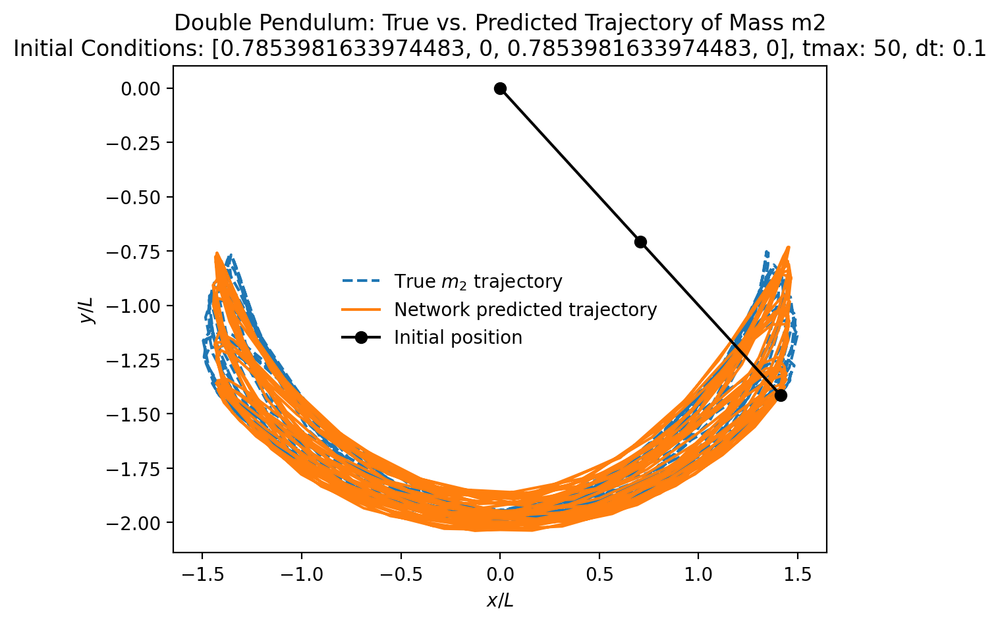

In [ ]:
# Predict and plot trajectories
predict_and_plot_trajectories(z0, tmax, dt)

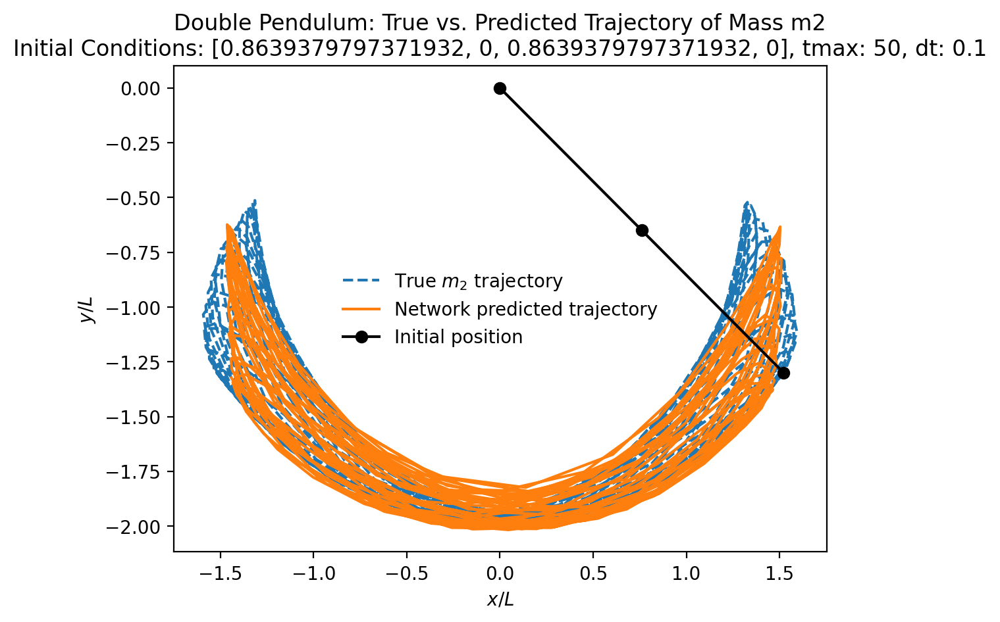

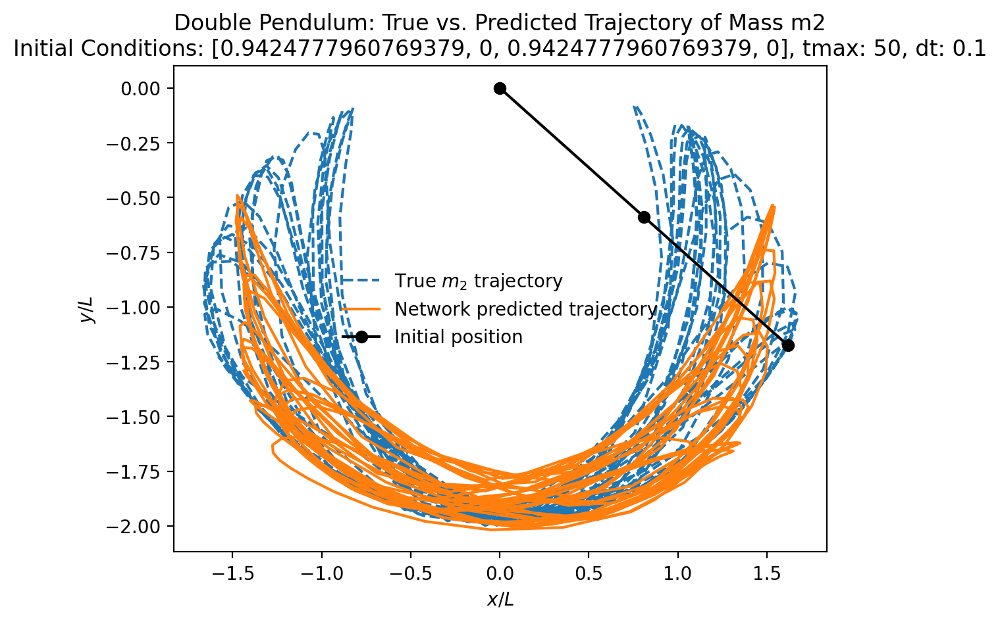

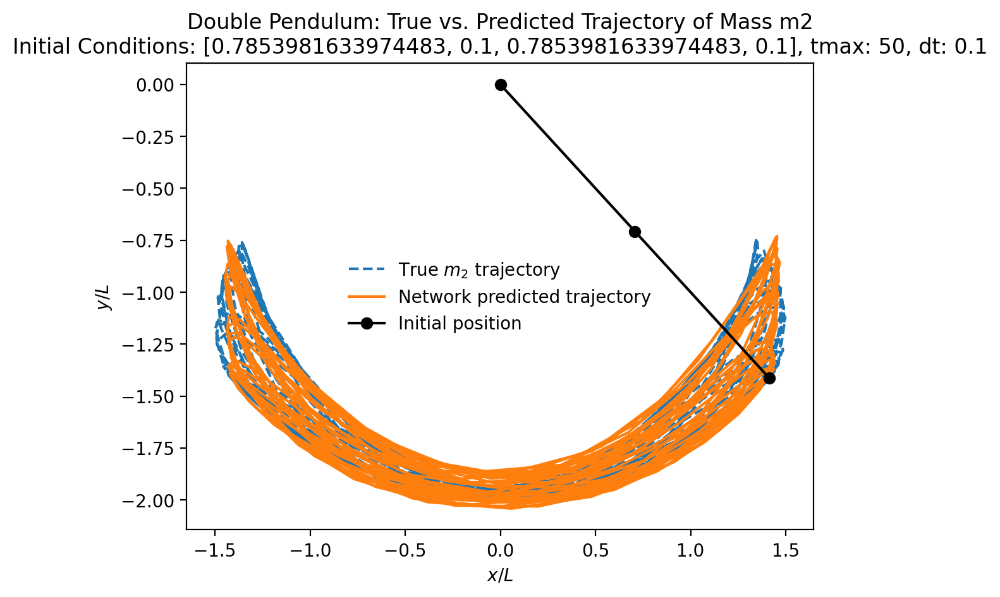

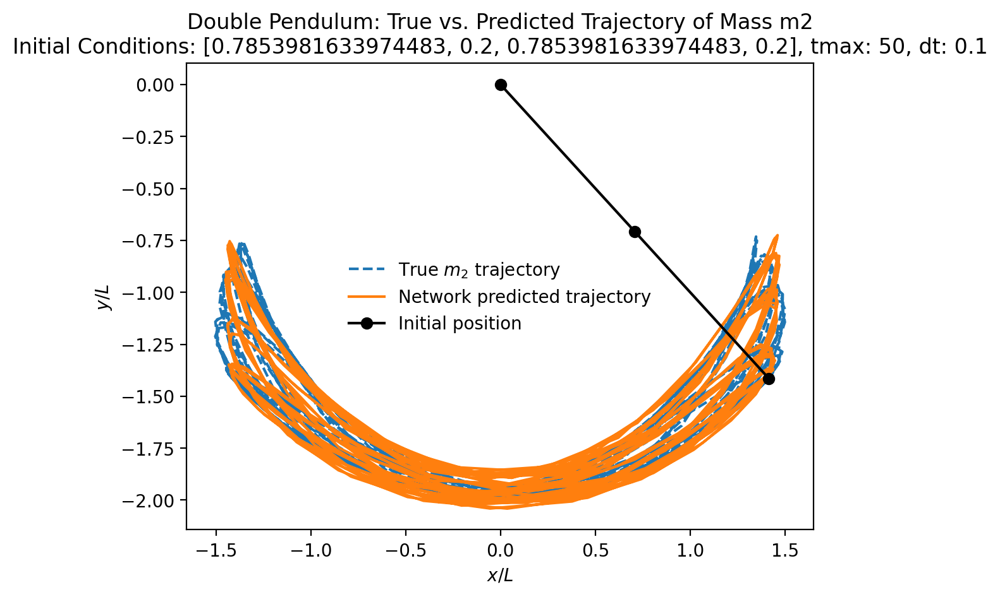

In [ ]:
# Vary initial conditions slightly and generate plots
initial_conditions = [
    [np.pi/4 * 1.1, 0, np.pi/4 * 1.1, 0],
    [np.pi/4 * 1.2, 0, np.pi/4 * 1.2, 0],
    [np.pi/4, 0.1, np.pi/4, 0.1],
    [np.pi/4, 0.2, np.pi/4, 0.2],
]

for z0_variation in initial_conditions:
    predict_and_plot_trajectories(z0_variation, tmax, dt)

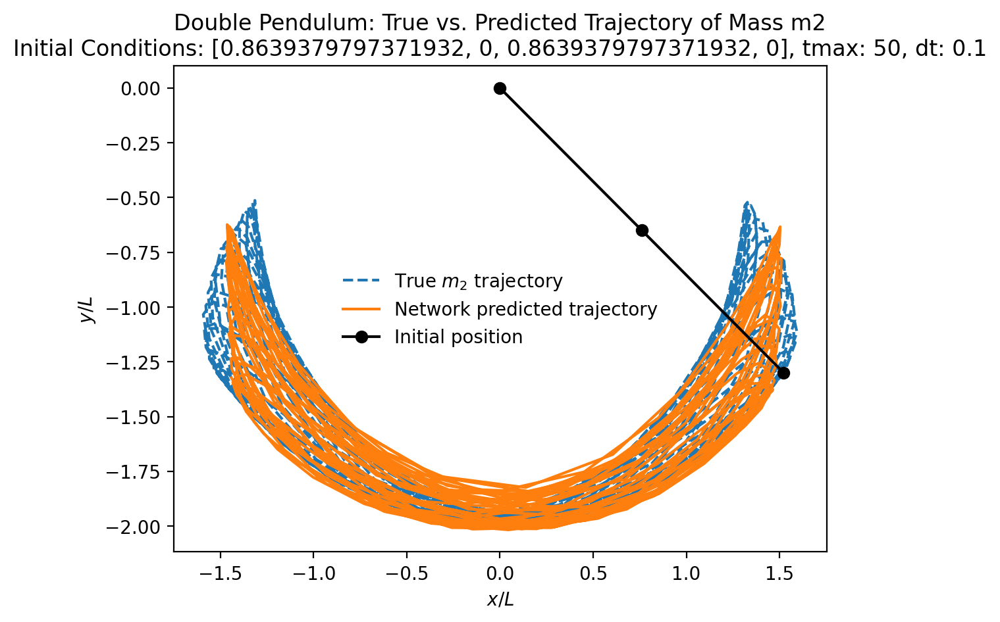

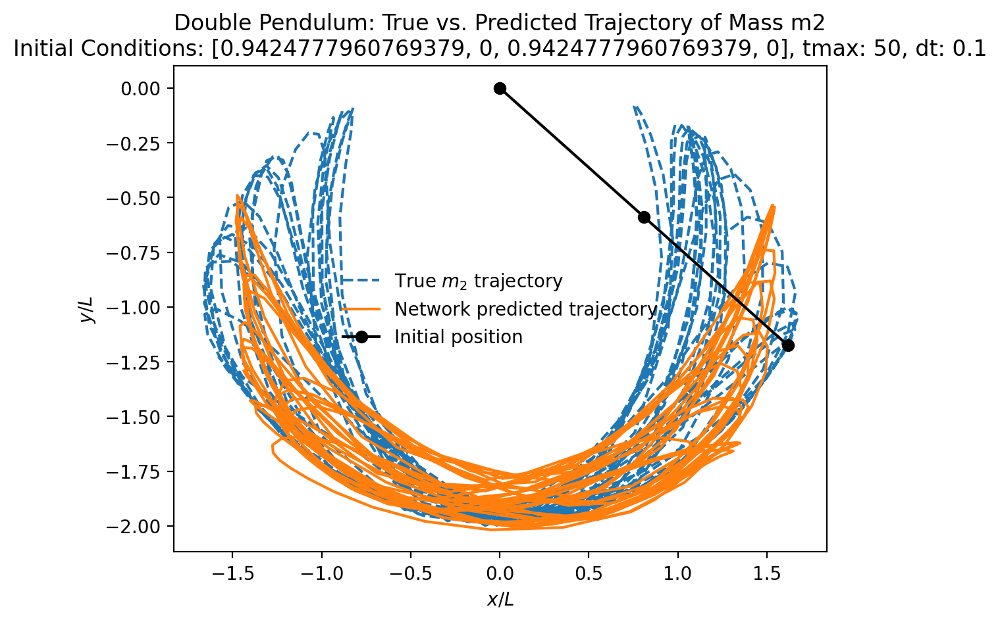

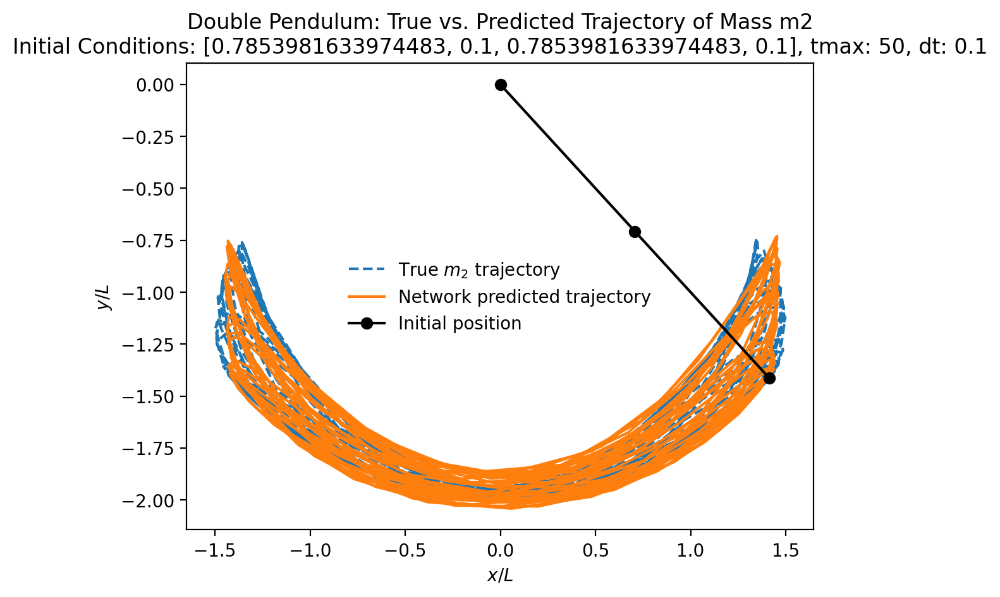

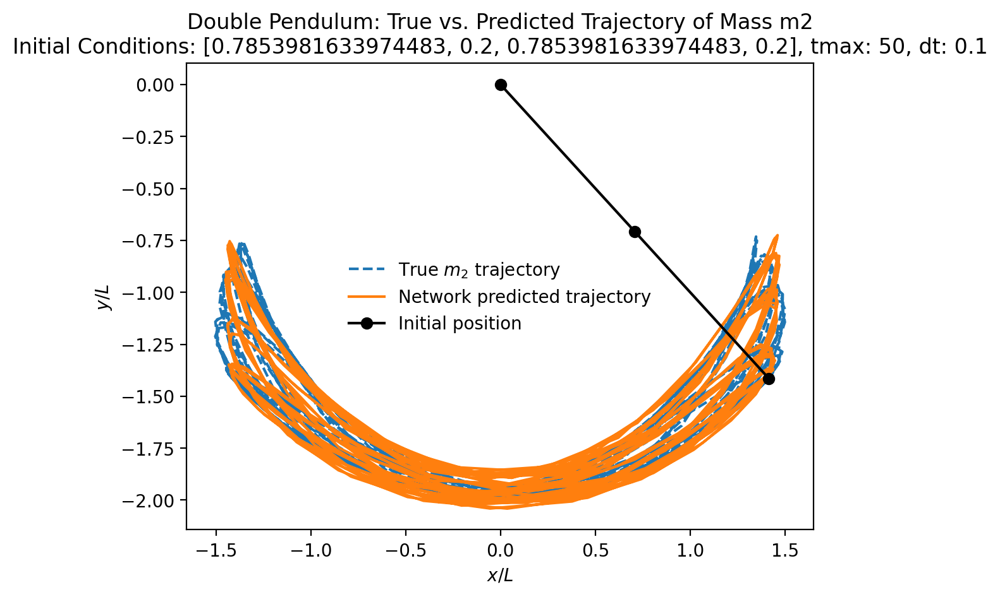

In [ ]:
# Vary initial conditions slightly and generate plots
initial_conditions = [
    [np.pi/4 * 1.1, 0, np.pi/4 * 1.1, 0],
    [np.pi/4 * 1.2, 0, np.pi/4 * 1.2, 0],
    [np.pi/4, 0.1, np.pi/4, 0.1],
    [np.pi/4, 0.2, np.pi/4, 0.2],
]

for z0_variation in initial_conditions:
    predict_and_plot_trajectories(z0_variation, tmax, dt)

Prediction looks fairly accurate, fairly robust until significant y abnormalities

## Testing how far into the future can a network predict.

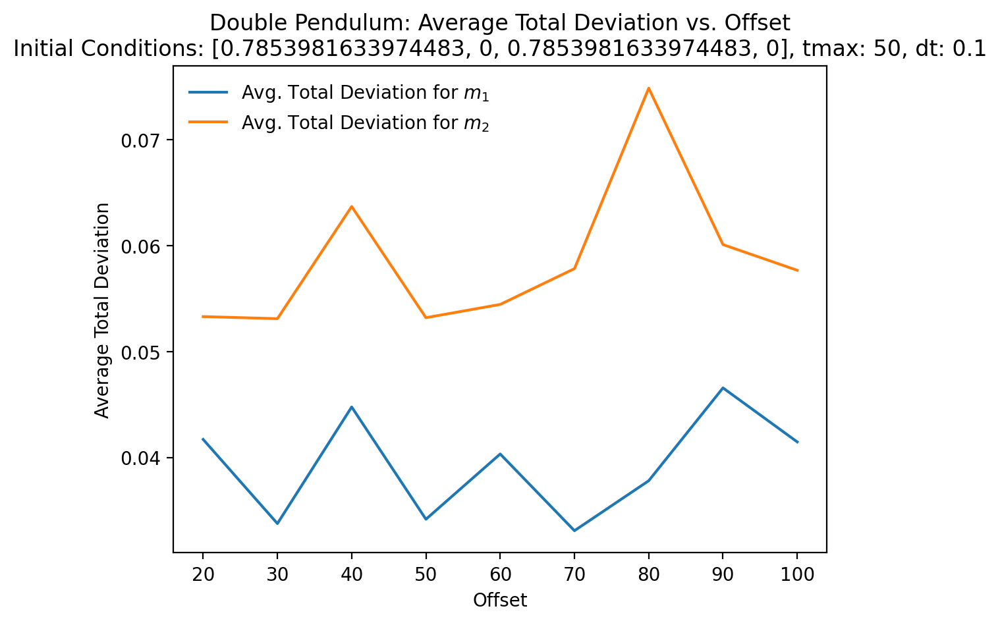

In [ ]:
# Plot prediction deviations
plot_prediction_deviation(z0, tmax, dt)

Larger deviation in m2 than there is for m1, as expected since m2 has a larger range of motion. Interestingly it seems to be going down in this case with a larger offset, however there is only 10 points and could be due to lack of sample size

## Repeating previous steps for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.

### 1. Design and train

In [ ]:
# New initial conditions
z0 = [np.pi/2, 0, np.pi/2, 0]
tmax = 20

# Create and train the model with the new initial conditions
model = create_and_train_model(z0, tmax, dt)

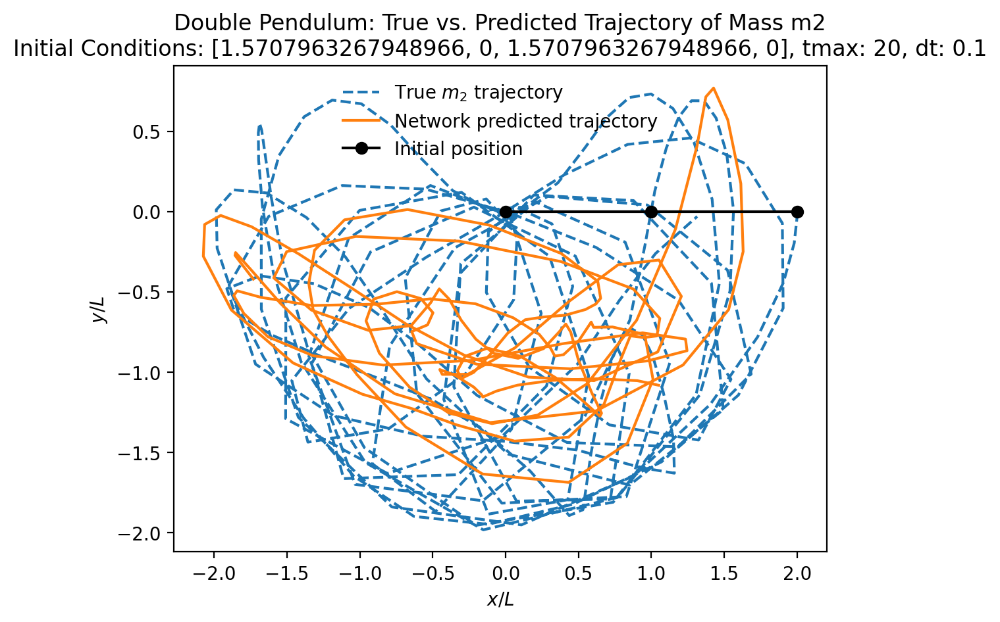

In [ ]:
# Predict and plot trajectories with the new initial conditions
predict_and_plot_trajectories(z0, tmax, dt)

Network struggling a lot more to match the true path.

### Stability Test

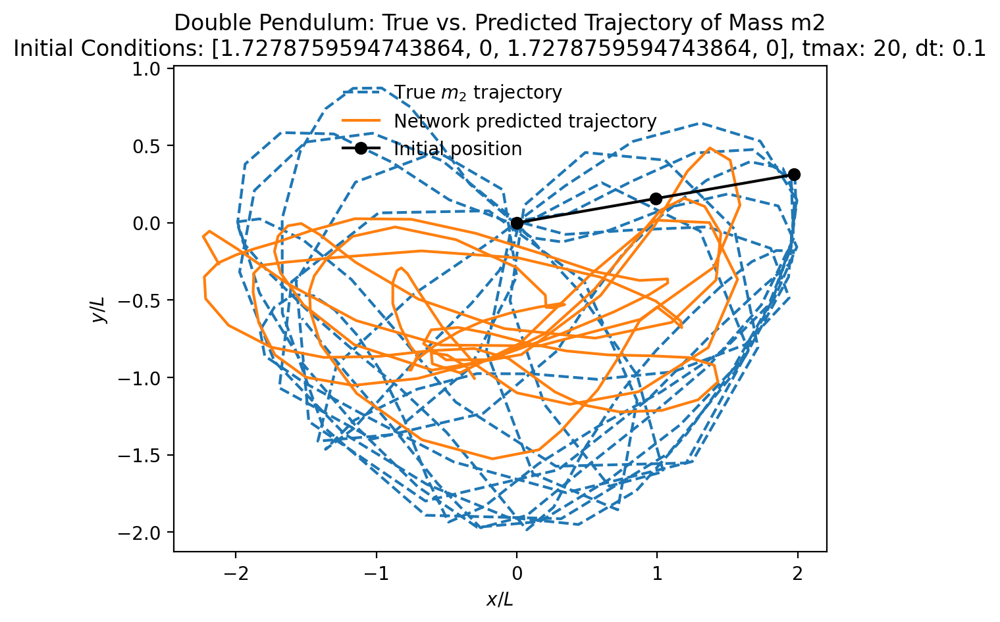

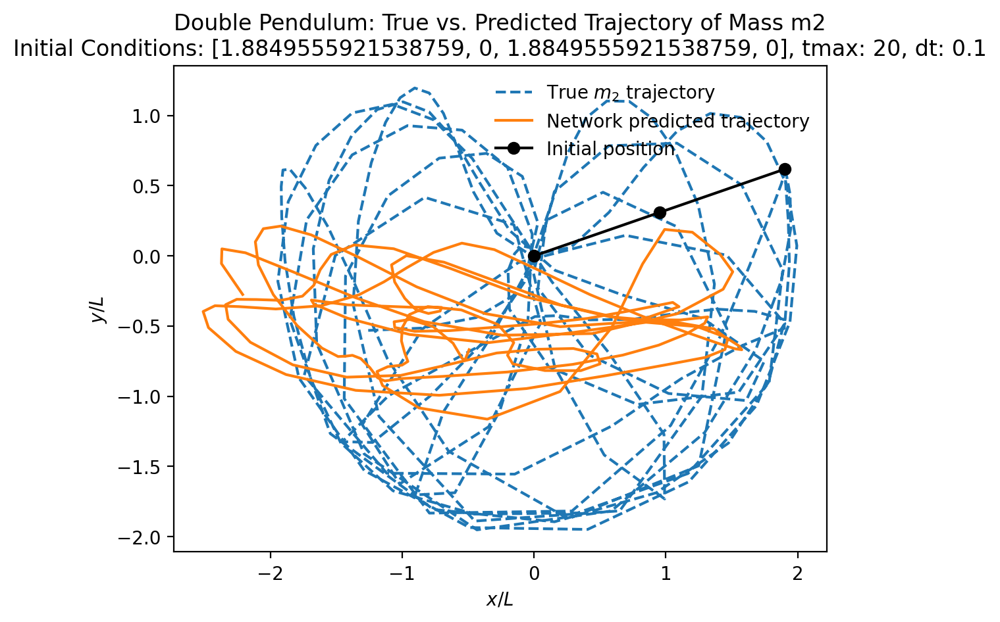

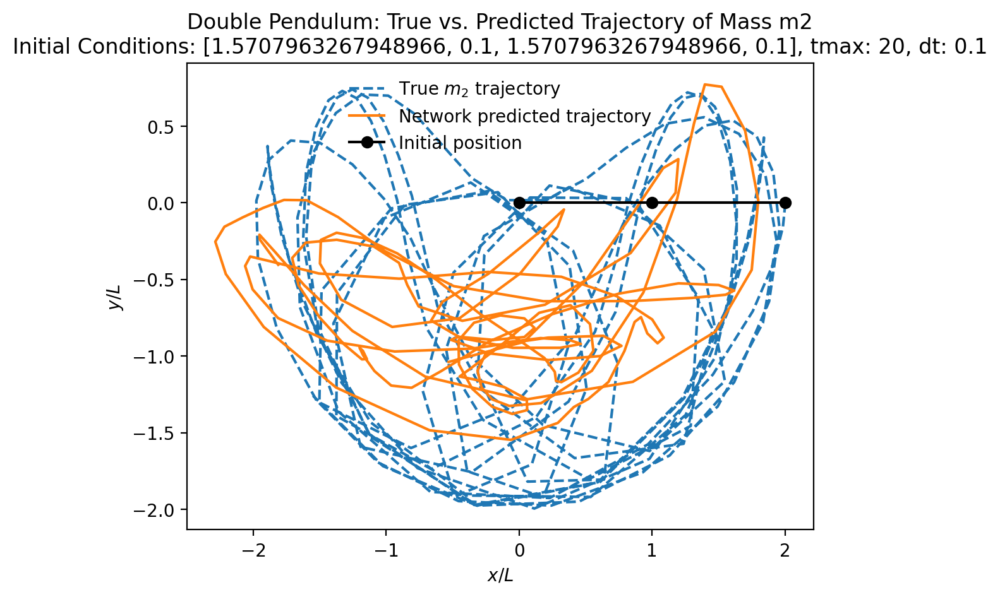

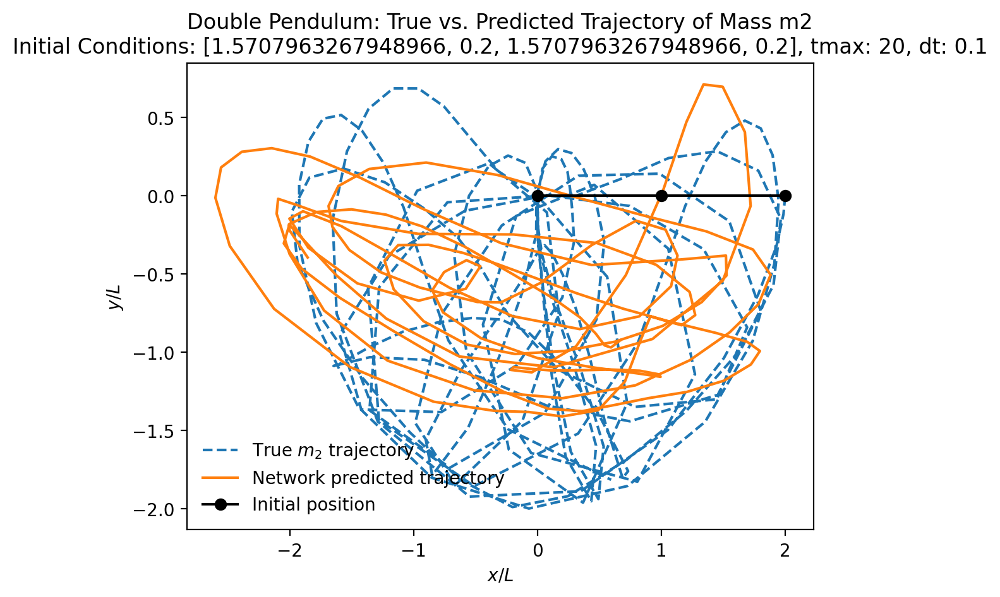

In [ ]:
# Vary initial conditions slightly and generate plots
initial_conditions = [
    [np.pi/2 * 1.1, 0, np.pi/2 * 1.1, 0],
    [np.pi/2 * 1.2, 0, np.pi/2 * 1.2, 0],
    [np.pi/2, 0.1, np.pi/2, 0.1],
    [np.pi/2, 0.2, np.pi/2, 0.2],
]

for z0_variation in initial_conditions:
    predict_and_plot_trajectories(z0_variation, tmax, dt)

Does seem to be doing fine with the x values, the y values are massively deviated though. Robustness doesn't matter as original prediction is pretty far off already.

### Time Deviation

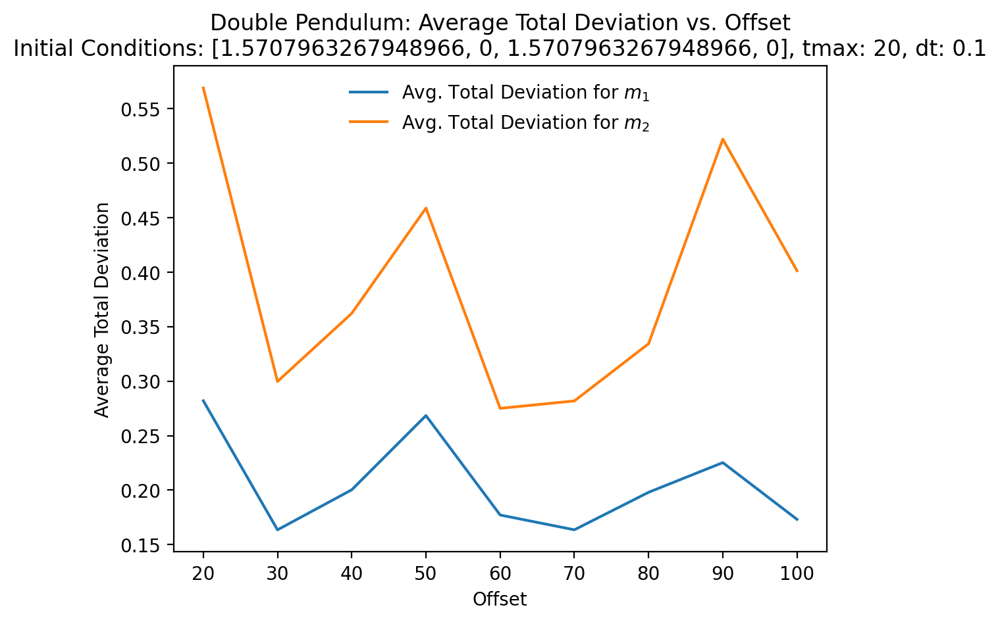

In [ ]:
# Plot prediction deviations with the new initial conditions
plot_prediction_deviation(z0, tmax, dt)

Need more points to interpret anything of value from this

## Repeat all steps again but only training neural network on the cartesian coordinates of the mass $m_2$

### 1. Design and train

In [ ]:
# Redefining initial conditions
z0=[np.pi/4,0,np.pi/4,0]
tmax = 50

# Create and train the model using only m2 data
model = create_and_train_model(z0, tmax, dt, train_on_both_masses=False)

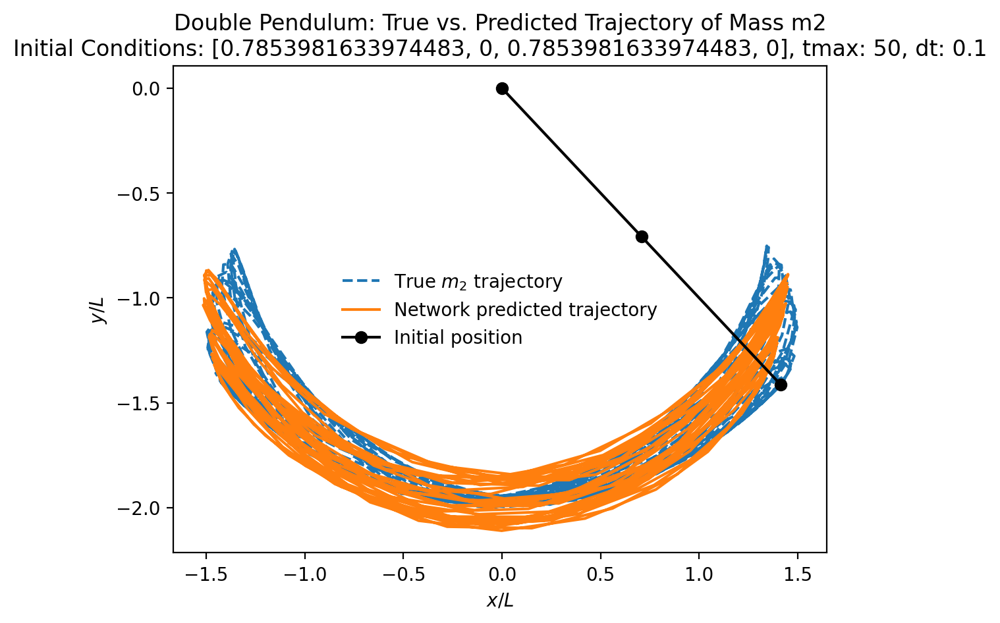

In [ ]:
predict_and_plot_trajectories(z0, tmax, dt, False)

### Stability Test

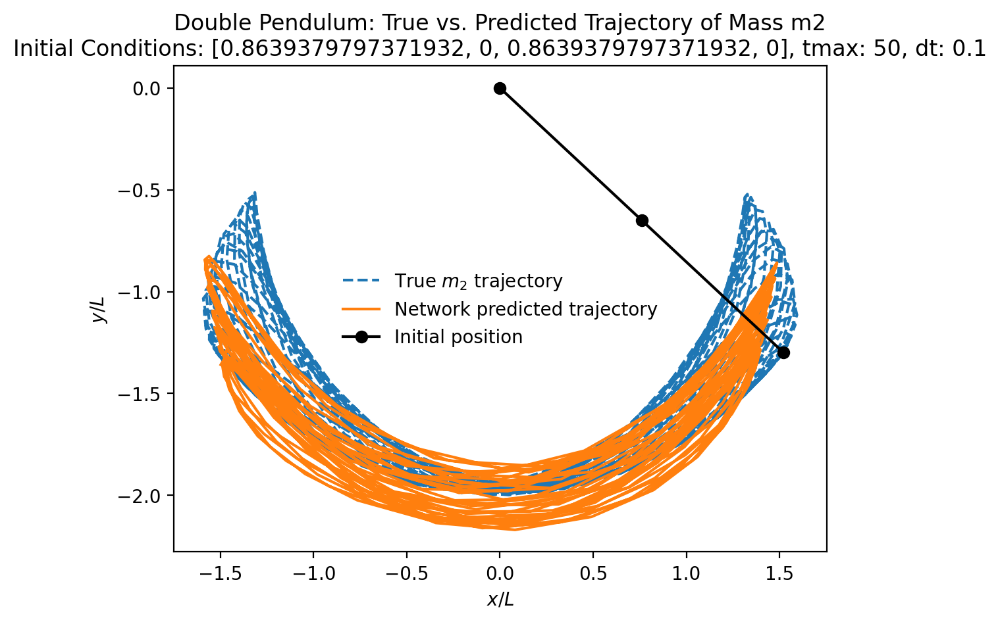

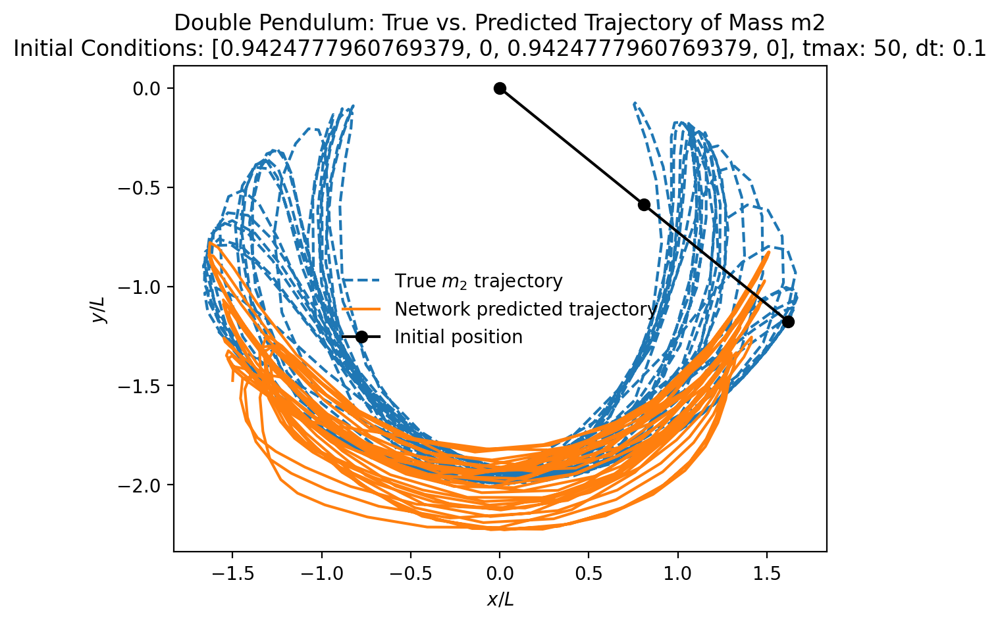

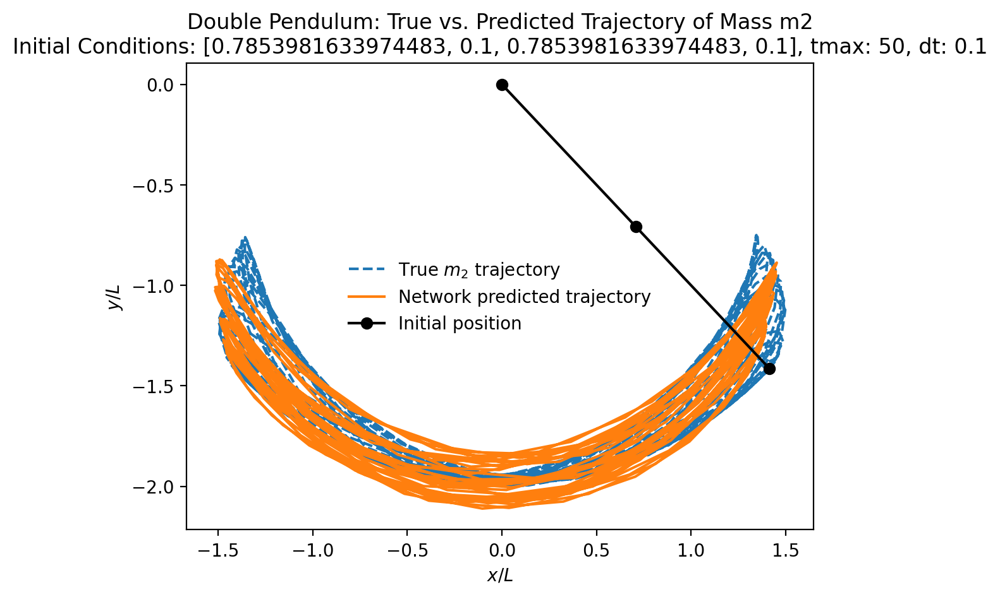

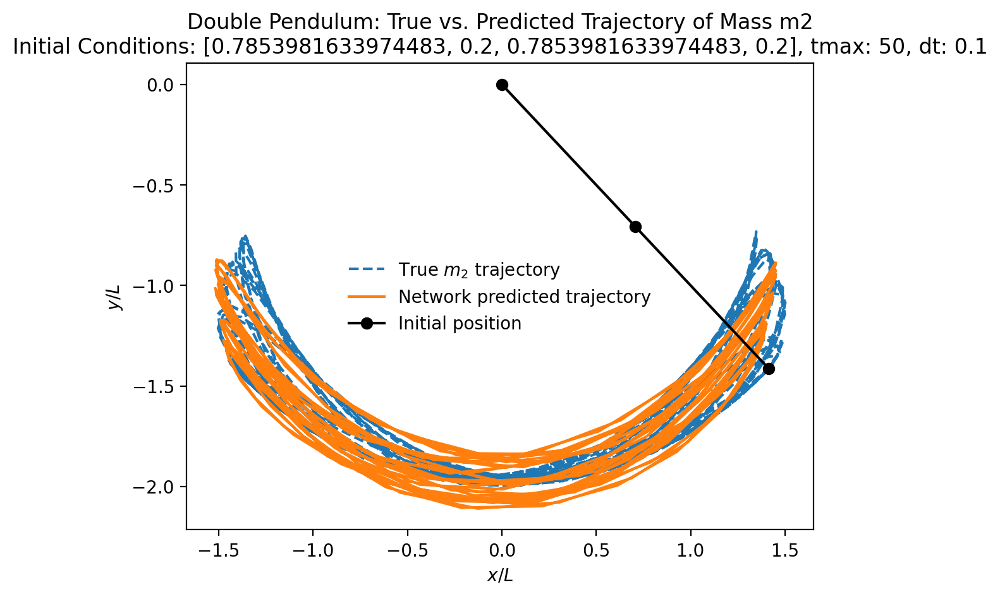

In [ ]:
# Vary initial conditions slightly and generate plots
initial_conditions = [
    [np.pi/4 * 1.1, 0, np.pi/4 * 1.1, 0],
    [np.pi/4 * 1.2, 0, np.pi/4 * 1.2, 0],
    [np.pi/4, 0.1, np.pi/4, 0.1],
    [np.pi/4, 0.2, np.pi/4, 0.2],
]

for z0_variation in initial_conditions:
    predict_and_plot_trajectories(z0_variation, tmax, dt, False)

Does fine on just m2, on the simple movement.

### Time devation

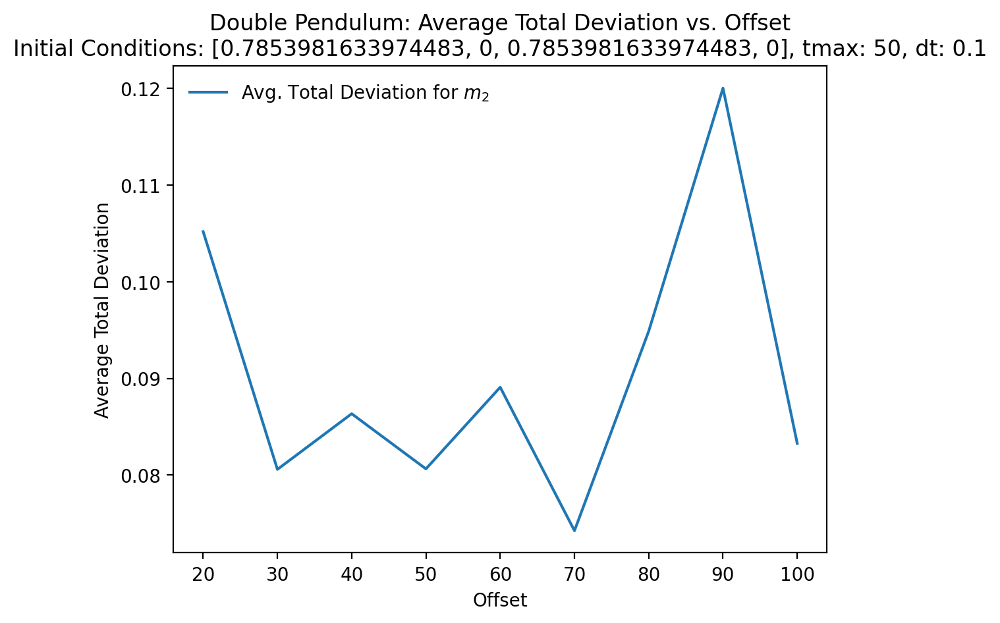

In [ ]:
plot_prediction_deviation(z0, tmax, dt, False)

Much higher deviation for a larger offset, m1 helps stabilise.

### Repeat repeat

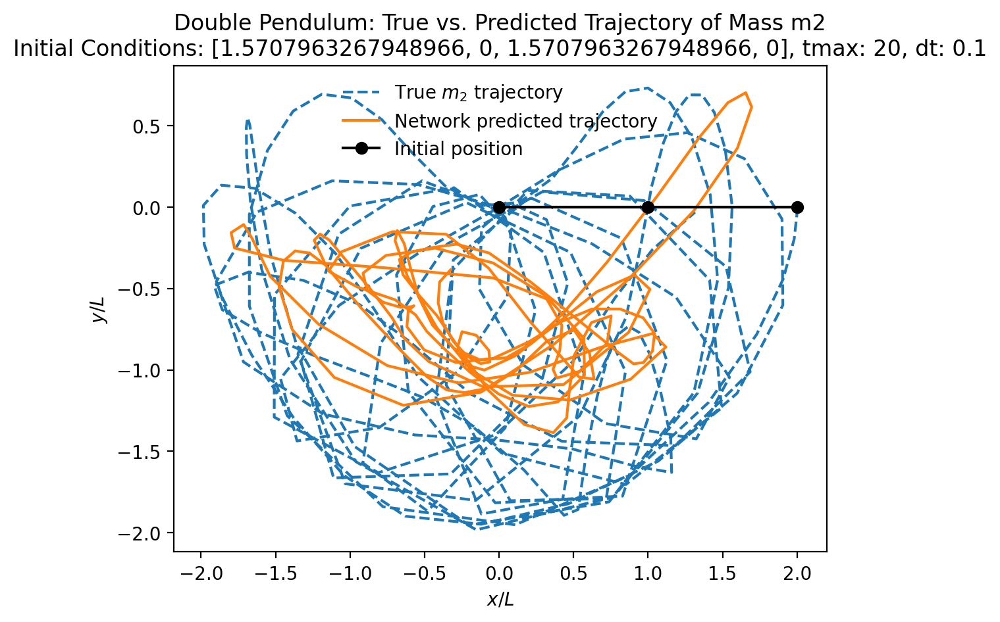

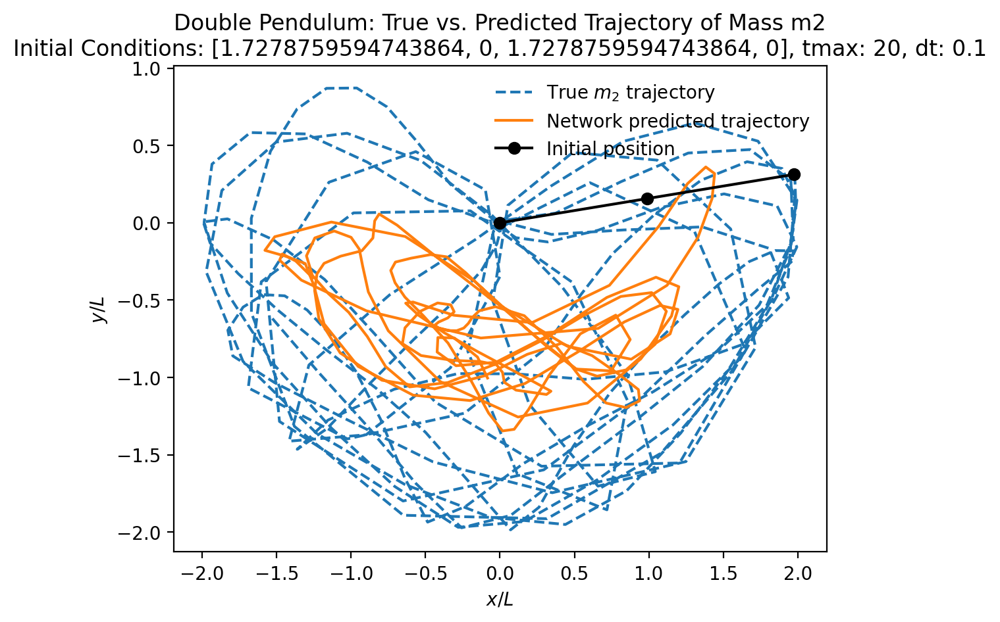

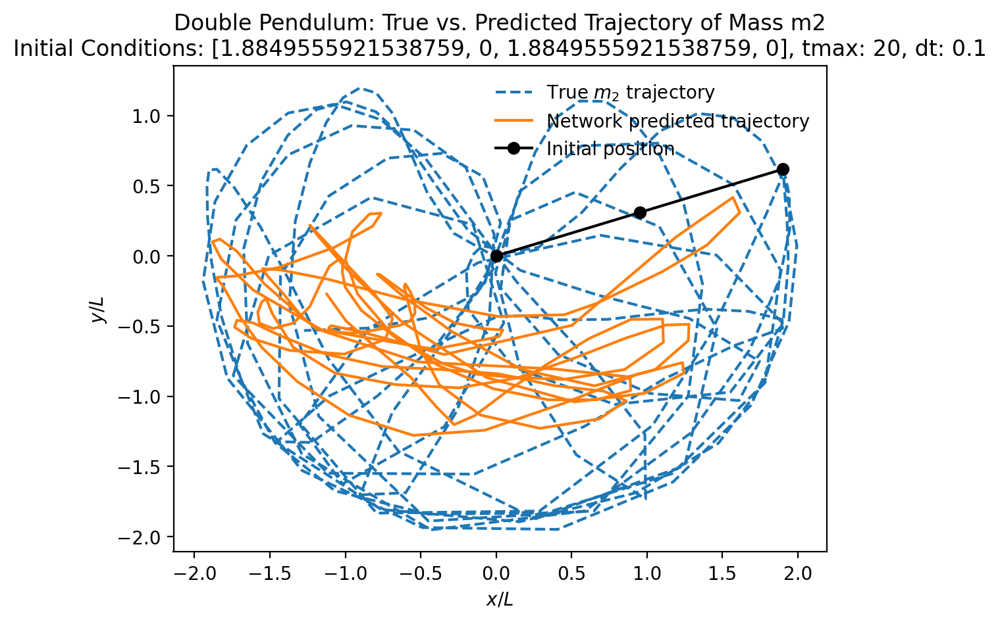

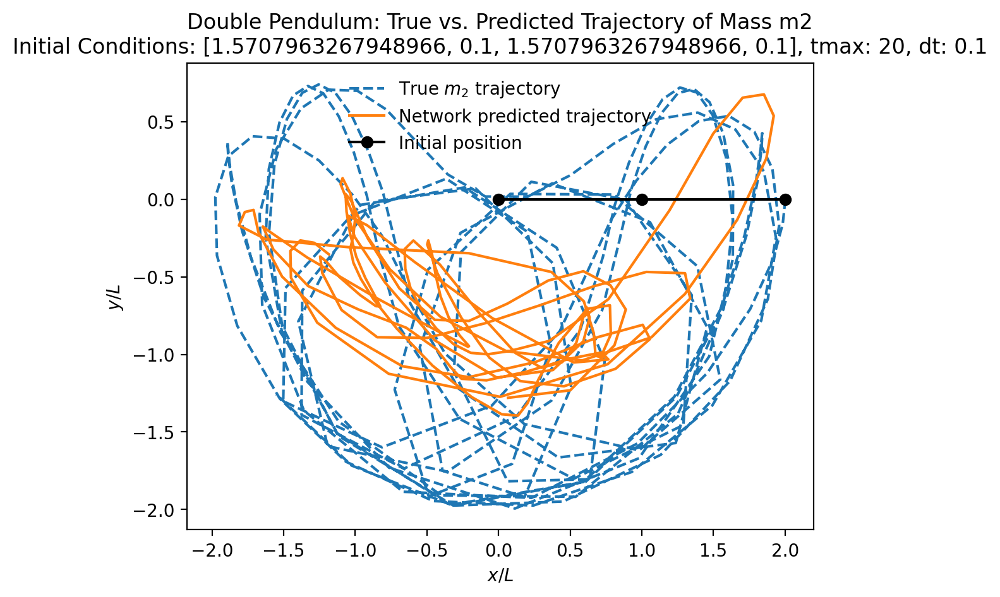

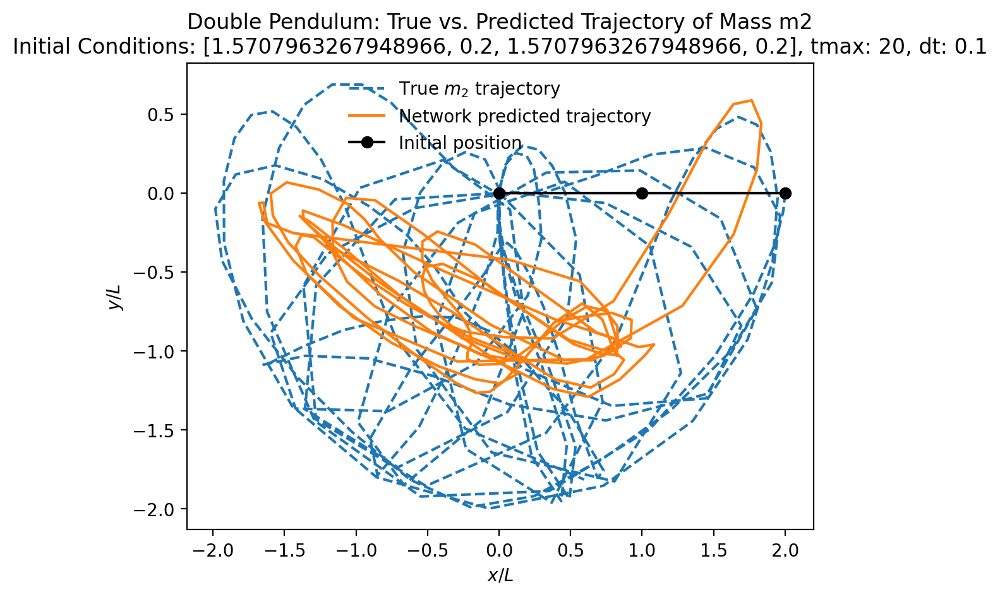

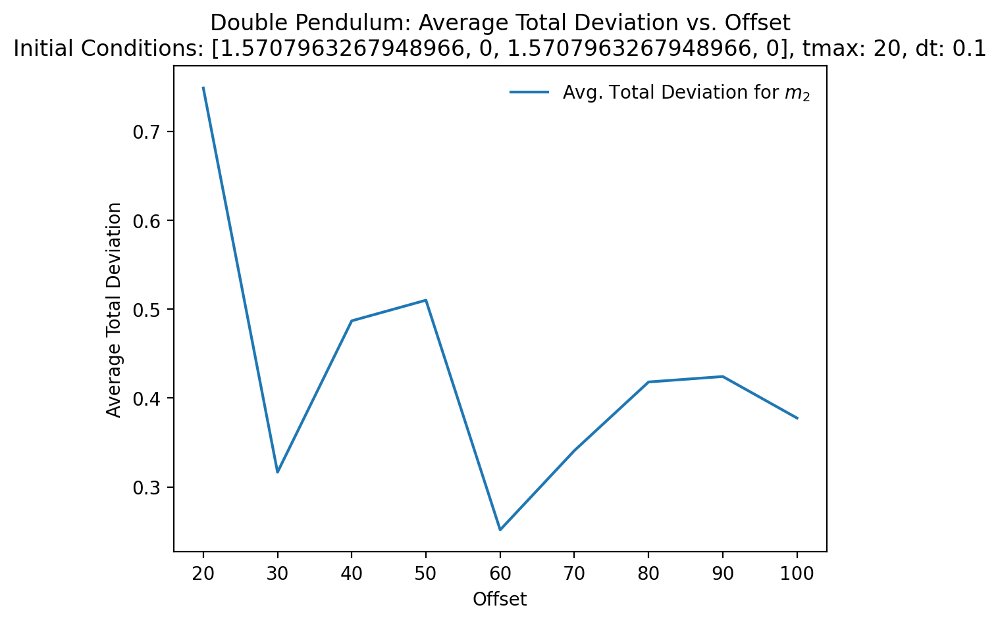

In [ ]:
# New initial conditions
z0 = [np.pi/2, 0, np.pi/2, 0]
tmax = 20


model = create_and_train_model(z0, tmax, dt, False)

predict_and_plot_trajectories(z0, tmax, dt, False)

# Vary initial conditions slightly and generate plots
initial_conditions = [
    [np.pi/2 * 1.1, 0, np.pi/2 * 1.1, 0],
    [np.pi/2 * 1.2, 0, np.pi/2 * 1.2, 0],
    [np.pi/2, 0.1, np.pi/2, 0.1],
    [np.pi/2, 0.2, np.pi/2, 0.2],
]

for z0_variation in initial_conditions:
    predict_and_plot_trajectories(z0_variation, tmax, dt, False)

plot_prediction_deviation(z0, tmax, dt, False)


Collapses immediately, no robustness.